# Reduction of science images

This tutorial will use observations from the telescope Campus Observatory Garching using the instrument Generic Off-the-shelf Wide Field Imager (GOWI).

**Steps of reduction:** (see manual)
- Organize data
- Bias subtraction
- Dark correction
- Flat-field correction
- Coaddition
- Astrometry and photometry

The zip file contains all the FITS file needed for this reduction tutorial. You should extract it all in one folder and change the path to your path.

**Go step by step. Don't run it everything at once.**

_____________________________

**Important information**

This pipeline is a basic reduction, and it shows you the steps to follow for the reduction of images. The final image could be improved by including different parameters in each step, viewing the images before, and selecting the right ones.

You can modify this pipeline as you like if you want to improve the reduction. You can see in Python what extra parameters can be added to each class.

# Organize data

The first step is to move into folders the calibrations and science files that are going to be use in processing.

As a first example, lets read one FITS image to see what it contains and how we can separate it:

In [1]:
import numpy as np
from astropy.io import fits
from astropy.nddata import CCDData
import os
import warnings; warnings.simplefilter('ignore')

path = './Data/Data/' # Path were the images are
image_name = 'COG_515175_M57_00_M 57_00__02_2022_10_25_17_33_26.fits' # Name of one FITS file
hdu = fits.open(path+image_name)
hdu.info()

FileNotFoundError: [Errno 2] No such file or directory: './Data/Data/COG_515175_M57_00_M 57_00__02_2022_10_25_17_33_26.fits'

The hdu is opening **one** FITS that contains the image header (1) and data (2)

In [5]:
header = hdu[0].header # (1) header of the FITS
hdu[0].header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                   16 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 4096 / length of array axis                           
NAXIS2  =                 4096 / length of array axis                           
DATE-OBS= '2022-10-25T17:33:26.9771416'                                         
END-OBS = '2022-10-25T17:34:28.2532806'                                         
EXPOSURE=                 60.0                                                  
XBINNING=                    1                                                  
YBINNING=                    1                                                  
IMAGETYP= 'Object'                                                              
EXPTIME =                 60.0                                                  
ALTITUDE=               65.4

In [6]:
data = hdu[0].data
hdu[0].data  # This will show the data 

array([[1255, 1305, 1296, ..., 1280, 1318, 1152],
       [1240, 1260, 1272, ..., 1495, 1304, 1150],
       [1278, 1307, 1288, ..., 1270, 1292, 1143],
       ...,
       [1259, 1299, 1297, ..., 1346, 1340, 1203],
       [1261, 1299, 1284, ..., 1303, 1322, 1191],
       [1249, 1293, 1280, ..., 1312, 1346, 1212]], dtype=uint16)

**To plot the image:**

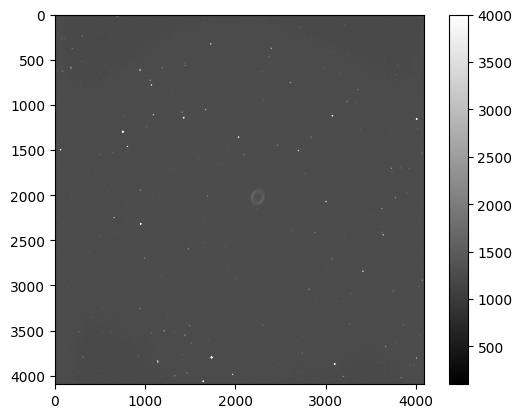

In [7]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

plt.figure()
plt.imshow(data, cmap='gray',vmin=100, vmax=4000)
plt.colorbar()

In [8]:
hdu.close()

This was an example for one image, what happens with many images? 

**One easy way to organize the data is to create folders for each type of images. To do this we can use ImageFileCollection from ccdproc, an astropy affiliated package for data reduction.**

This will show us a summary of the images:

In [9]:
from ccdproc import ImageFileCollection

images = ImageFileCollection(path)
images.summary

file,simple,bitpix,naxis,naxis1,naxis2,date-obs,end-obs,exposure,xbinning,ybinning,imagetyp,exptime,altitude,azimuth,dec,dec-ref,dec-tel,flipstat,ra,radecsys,ra-ref,ra-tel,istracki,airtemp,dometem,domehum,windspd,windpea,windavg,rain,cloubas,devitem,israin,iscloud,instrume,telescop,pxscal1,pxscal2,obscode,obslat,obslon,obsalt,filter,object,progid,progname,focuspos,epoch,observer,ownergid,ownergnm,ownerid,ownernm,alt-ref,az-ref,fullsize,frameid,abotver,ha,focusamt,focusmit,ccd-temp,set-temp,ccdfullh,ccdfullw,bscale,bzero,gpsstart,gpsend,xorgsubf,yorgsubf,progfrom,progto,sensorid,campid,projid,tslotid,agentid,targetid,targfrom,targto,catid,atomid,priority
str54,bool,int32,int32,int32,int32,str27,str27,float64,int32,int32,str6,float64,float64,float64,float64,str12,float64,str4,float64,str4,str12,float64,str5,str5,str5,str5,str1,str1,str1,str1,str8,str5,str5,str5,str14,str16,str17,str17,str3,str11,str11,str3,str6,str8,str48,str3,int32,str4,str4,str36,str19,str36,str19,str2,str3,object,str36,str3,float64,float64,float64,float64,float64,int32,int32,float64,float64,object,object,object,object,object,object,object,object,object,object,object,object,object,object,object,object,object
COG_514146_Dark11_60_0_2022_10_22_15_30_27.fits,True,16,2,4096,4096,2022-10-22T15:30:27.6498445,2022-10-22T15:31:28.4212312,60.0,1,1,Dark,60.0,79.9997222222222,270.000277777778,47.2947222222222,00:00:00,47.2947222222222,East,17.3738611111111,ICRS,00:00:00,17.3823055555556,False,16.95,19.47,57.13,0,0,0,0,2885.286,17.92,False,False,SBIG:X10120096,10Micron 4000HPS,0.441321015750558,0.441321015750558,COG,48.26128889,11.67117778,535,Halpha,DarkSpot,darkProgram_b8d31e8a-b3cf-4d7a-9e14-f77f0f76baf4,,14167,REAL,Abot,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,80,270,FALSE,40edffce-758d-4e54-859a-8afc698799d8,2.0,0.258922866505959,19.0625,18.25,-14.97,-14.97,4096,4096,1.0,32768.0,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--
COG_514147_Dark11_60_1_2022_10_22_15_31_47.fits,True,16,2,4096,4096,2022-10-22T15:31:47.0907568,2022-10-22T15:32:47.9231137,60.0,1,1,Dark,60.0,79.9997222222222,270.000277777778,47.2947222222222,00:00:00,47.2947222222222,East,17.3958333333333,ICRS,00:00:00,17.4043055555556,False,16.9,19.44,56.91,0,0,0,0,2885.83,17.92,False,False,SBIG:X10120096,10Micron 4000HPS,0.441321015750558,0.441321015750558,COG,48.26128889,11.67117778,535,Halpha,DarkSpot,darkProgram_0cccd9cd-4c10-4f34-a180-1f528e60e9c9,,14167,REAL,Abot,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,80,270,FALSE,e260232d-0d10-43ae-8cb3-ff90b3595b42,2.0,0.258922866505959,19.0625,18.25,-15.03,-15.03,4096,4096,1.0,32768.0,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--
COG_514184_flats_Green_04_2022_10_22_16_32_55.fits,True,16,2,4096,4096,2022-10-22T16:32:55.0907910,2022-10-22T16:32:56.8560004,0.05,1,1,Flat,0.05,50.1613888888889,89.945,34.9858333333333,34:51:46.398,34.9858333333333,West,22.8286111111111,ICRS,22:48:39.81,22.8285833333333,True,14.99,15.92,74.16,0,0,0,0,2443.986,14.3,False,False,SBIG:X10120096,10Micron 4000HPS,0.441321015750558,0.441321015750558,COG,48.26128889,11.67117778,535,Green,,,,14348,REAL,Abot,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,0,0,FALSE,b2867ed2-f7e6-4a04-8aed-d4410a191817,2.0,-0.898190523934244,17.6875,18.3125,-15.03,-15.03,4096,4096,1.0,32768.0,2022-10-22T16:32:56.1256629,2022-10-22T16:32:56.2096252,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--
COG_514185_flats_Green_03_2022_10_22_16_33_22.fits,True,16,2,4096,4096,2022-10-22T16:33:22.0116032,2022-10-22T16:33:25.3230906,2.0,1,1,Flat,2.0,50.0230555555556,89.6997222222222,35.0005555555556,34:51:47.29,35.0005555555556,West,22.8419444444444,ICRS,22:50:35.961,22.8419444444444,False,14.99,15.87,74.5,0,0,0,0,2441.212,14.3,False,False,SBIG:X10120096,10Micron 4000HPS,0.441321015750558,0.441321015750558,COG,48.2

In [10]:
#Create an image file collection with the keys:

keys = ['imagetyp','object','exptime','filter']
allimages = ImageFileCollection(path, keywords=keys)
allimages.summary 

file,imagetyp,object,exptime,filter
str54,str6,str8,float64,str6
COG_514146_Dark11_60_0_2022_10_22_15_30_27.fits,Dark,DarkSpot,60.0,Halpha
COG_514147_Dark11_60_1_2022_10_22_15_31_47.fits,Dark,DarkSpot,60.0,Halpha
COG_514184_flats_Green_04_2022_10_22_16_32_55.fits,Flat,,0.05,Green
COG_514185_flats_Green_03_2022_10_22_16_33_22.fits,Flat,,2.0,Green
COG_514186_flats_Green_02_2022_10_22_16_33_47.fits,Flat,,7.81,Green
COG_514187_flats_Green_01_2022_10_22_16_34_37.fits,Flat,,9.48,Green
COG_514188_flats_Green_00_2022_10_22_16_35_28.fits,Flat,,11.32,Green
COG_514189_flats_Red_04_2022_10_22_16_36_46.fits,Flat,,0.05,Red
COG_514190_flats_Red_03_2022_10_22_16_37_28.fits,Flat,,2.0,Red


**As you can see, there are images that are Bias, Flats, Darks and Object**

In [11]:
# List of science images
sciencelist = allimages.files_filtered(imagetyp='Object')
print(sciencelist)

['COG_515173_M57_00_M 57_00__00_2022_10_25_17_30_47.fits'
 'COG_515174_M57_00_M 57_00__01_2022_10_25_17_32_07.fits'
 'COG_515175_M57_00_M 57_00__02_2022_10_25_17_33_26.fits'
 'COG_515176_M57_00_M 57_00__00_2022_10_25_17_34_57.fits'
 'COG_515177_M57_00_M 57_00__01_2022_10_25_17_36_17.fits'
 'COG_515178_M57_00_M 57_00__02_2022_10_25_17_37_36.fits'
 'COG_515179_M57_00_M 57_00__00_2022_10_25_17_39_11.fits'
 'COG_515180_M57_00_M 57_00__01_2022_10_25_17_40_31.fits'
 'COG_515181_M57_00_M 57_00__02_2022_10_25_17_41_51.fits'
 'COG_515182_M57_00_M 57_00__00_2022_10_25_17_43_35.fits'
 'COG_515183_M57_00_M 57_00__01_2022_10_25_17_44_55.fits']


# Create a folder for each calibration

In [12]:
from pathlib import Path

#Bias

Bias_data = Path(path, 'Bias')  
Bias_data.mkdir(exist_ok=True) 

biases = allimages.files_filtered(imagetyp='Bias', include_path=True)
#print(Bias_data)

import shutil

for bias in biases:
    shutil.move(bias, Bias_data)

In [13]:
#Dark

Dark_data = Path(path, 'Dark')  
Dark_data.mkdir(exist_ok=True) 

darks = allimages.files_filtered(imagetyp='Dark', include_path=True)

for dark in darks:
    shutil.move(dark, Dark_data)

In [14]:
# Flats

Flat_data = Path(path, 'Flats')  
Flat_data.mkdir(exist_ok=True) 

flats = allimages.files_filtered(imagetyp='Flat', include_path=True)

for flat in flats:
    shutil.move(flat, Flat_data)

In [15]:
# Science images

img_data = Path(path, 'Object')  
img_data.mkdir(exist_ok=True) 

imgs = allimages.files_filtered(imagetyp='Object', include_path=True)

for img in imgs:
    shutil.move(img, img_data)

# Create master bias frame

In [16]:
bias_folder = ImageFileCollection(path+'Bias') #showing all the bias images in this folder
bias_folder.summary

file,simple,bitpix,naxis,naxis1,naxis2,date-obs,end-obs,exposure,xbinning,ybinning,imagetyp,exptime,altitude,azimuth,dec,dec-ref,dec-tel,flipstat,ra,radecsys,ra-ref,ra-tel,istracki,airtemp,dometem,domehum,windspd,windpea,windavg,rain,cloubas,devitem,israin,iscloud,instrume,telescop,pxscal1,pxscal2,obscode,obslat,obslon,obsalt,filter,object,progid,progname,focuspos,epoch,observer,ownergid,ownergnm,ownerid,ownernm,alt-ref,az-ref,gpsstart,gpsend,fullsize,frameid,abotver,ha,focusamt,focusmit,ccd-temp,set-temp,ccdfullh,ccdfullw,bscale,bzero,xorgsubf,yorgsubf
str44,bool,int32,int32,int32,int32,str27,str27,float64,int32,int32,str4,float64,float64,float64,float64,str8,float64,str4,float64,str4,str8,float64,str5,str5,str5,str5,str1,str1,str1,str1,str8,str5,str5,str5,str14,str16,str17,str17,str3,str11,str11,str3,str6,str8,str48,str1,int32,str4,str4,str36,str19,str36,str19,str2,str3,str27,str27,str5,str36,str3,float64,float64,float64,float64,float64,int32,int32,float64,float64,object,object
COG_515120_Bias11_0_2022_10_25_15_22_43.fits,True,16,2,4096,4096,2022-10-25T15:22:43.1513203,2022-10-25T15:22:44.2828078,0.0,1,1,Bias,0.0,79.9997222222222,269.999166666667,47.2947222222222,00:00:00,89.7205555555556,East,10.4829166666667,ICRS,00:00:00,17.4336111111111,False,17.15,19.86,55.15,0,0,0,0,3179.294,18.47,False,False,SBIG:X10120096,10Micron 4000HPS,0.441321015750558,0.441321015750558,COG,48.26128889,11.67117778,535,Halpha,DarkSpot,biasProgram_7727e4da-7ef1-491b-91ba-b047e2b450ac,,14167,REAL,Abot,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,80,270,2022-10-25T02:07:55.2103629,2022-10-25T02:07:55.2103629,FALSE,f22f49b0-0479-43f6-8646-55a22cf59a32,2.0,2.06437691800634,19.8125,19.0625,-15.19,-15.19,4096,4096,1.0,32768.0,--,--
COG_515131_Bias11_1_2022_10_25_15_51_29.fits,True,16,2,4096,4096,2022-10-25T15:51:29.5142638,2022-10-25T15:51:30.6647443,0.0,1,1,Bias,0.0,79.9997222222222,270.000277777778,47.2947222222222,00:00:00,47.2947222222222,East,17.8620833333333,ICRS,00:00:00,17.9145833333333,False,16.04,19.05,57.68,0,0,0,0,2812.2,15.84,False,False,SBIG:X10120096,10Micron 4000HPS,0.441321015750558,0.441321015750558,COG,48.26128889,11.67117778,535,Halpha,DarkSpot,biasProgram_7ee338e2-4ed6-4f54-9c4f-eee695cd55c0,,14167,REAL,Abot,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,80,270,2022-10-25T02:07:55.2103629,2022-10-25T02:07:55.2103629,FALSE,3ba17a23-af42-43a8-a242-47aec5a58a6a,2.0,0.258922866505959,19.8125,19.0625,-14.97,-14.97,4096,4096,1.0,32768.0,--,--
COG_515132_Bias11_2_2022_10_25_15_51_49.fits,True,16,2,4096,4096,2022-10-25T15:51:49.3452292,2022-10-25T15:51:50.4667210,0.0,1,1,Bias,0.0,79.9997222222222,270.000277777778,47.2947222222222,00:00:00,47.2947222222222,East,17.8672222222222,ICRS,00:00:00,17.9196944444444,False,16.02,19,57.79,0,0,0,0,2809.986,15.8,False,False,SBIG:X10120096,10Micron 4000HPS,0.441321015750558,0.441321015750558,COG,48.26128889,11.67117778,535,Halpha,DarkSpot,biasProgram_5e8f79cd-f57a-406c-8981-64231028b6b8,,14167,REAL,Abot,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,80,270,2022-10-25T02:07:55.2103629,2022-10-25T02:07:55.2103629,FALSE,b0ff598f-7928-4e58-9610-f2e878de11c4,2.0,0.258922866505959,19.8125,19.0625,-14.97,-14.97,4096,4096,1.0,32768.0,--,--
COG_515133_Bias11_3_2022_10_25_15_52_09.fits,True,16,2,4096,4096,2022-10-25T15:52:09.1272388,2022-10-25T15:52:10.2777152,0.0,1,1,Bias,0.0,79.9997222222222,270.000277777778,47.2947222222222,00:00:00,47.2947222222222,East,17.874,ICRS,00:00:00,17.9247777777778,False,16.02,19.02,57.68,0,0,0,0,2797.806,15.76,False,False,SBIG:X10120096,10Micron 4000HPS,0.441321015750558,0.441321015750558,COG,48.26128889,11.67117778,535,Halpha,DarkSpot,biasProgram_f801400c-2c95-4689-9df7-1d218176e74d,,14167,REAL,Abot,449a9a7e-5f18-436c-a1ff-edb64d990619,Calibration Manager,449a9a7e-5f18-436c-a1ff-edb64

In [17]:
from astropy.nddata import CCDData
from astropy.stats import mad_std
import ccdproc as ccdp

calibrated_path = Path(path+'Bias')
reduced_images = ccdp.ImageFileCollection(calibrated_path)

calibrated_biases = reduced_images.files_filtered(imagetyp='Bias', include_path=True)

combined_bias = ccdp.combine(calibrated_biases, method='average', unit='adu')

combined_bias.meta['combined'] = True

combined_bias.write(calibrated_path / 'combined_bias_2.fit') #name of bias master 


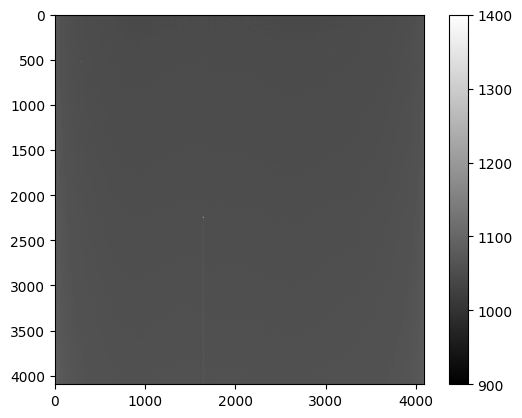

In [18]:
## see combined BIAS image
image_name_bias = 'combined_bias_2.fit' # Name of the FITS file
comb_bias = fits.open(path+'Bias/'+image_name_bias)
data_bias=comb_bias[0].data

plt.figure()
plt.imshow(data_bias, cmap='gray',vmin=900, vmax=1400)
plt.colorbar()

# Create master Dark

In [19]:
# First see that the time exposure are the same for the science images and the Darks

path_images = Path(path+'Object/')
path_darks = Path(path+'Dark/')

images_raw = ImageFileCollection(path_images)
darks_raw = ImageFileCollection(path_darks)

In [20]:
images_raw.summary['file', 'imagetyp', 'exptime', 'filter']

file,imagetyp,exptime,filter
str54,str6,float64,str5
COG_515173_M57_00_M 57_00__00_2022_10_25_17_30_47.fits,Object,60.0,Red
COG_515174_M57_00_M 57_00__01_2022_10_25_17_32_07.fits,Object,60.0,Red
COG_515175_M57_00_M 57_00__02_2022_10_25_17_33_26.fits,Object,60.0,Red
COG_515176_M57_00_M 57_00__00_2022_10_25_17_34_57.fits,Object,60.0,Green
COG_515177_M57_00_M 57_00__01_2022_10_25_17_36_17.fits,Object,60.0,Green
COG_515178_M57_00_M 57_00__02_2022_10_25_17_37_36.fits,Object,60.0,Green
COG_515179_M57_00_M 57_00__00_2022_10_25_17_39_11.fits,Object,60.0,Blue
COG_515180_M57_00_M 57_00__01_2022_10_25_17_40_31.fits,Object,60.0,Blue
COG_515181_M57_00_M 57_00__02_2022_10_25_17_41_51.fits,Object,60.0,Blue


In [21]:
darks_raw.summary['file', 'imagetyp', 'exptime']

file,imagetyp,exptime
str47,str4,float64
COG_514146_Dark11_60_0_2022_10_22_15_30_27.fits,Dark,60.0
COG_514147_Dark11_60_1_2022_10_22_15_31_47.fits,Dark,60.0
COG_515123_Dark11_60_0_2022_10_25_15_25_11.fits,Dark,60.0
COG_515124_Dark11_60_1_2022_10_25_15_26_31.fits,Dark,60.0


In [22]:
dark_exptime = set(darks_raw.summary['exptime'])
print(dark_exptime)
#print(darks_raw.summary['file'])

{60.0}


In [23]:
# Search for the combined bias 
combined_bias = CCDData.read(path+'Bias/'+image_name_bias)

darks_1 = darks_raw.files_filtered(imagetyp='Dark')
combined_Dark=0

# subtract bias from the darks and save them as Darks_X.fits
for j in range(0,len(darks_1)):
    combined_Dark = CCDData.read(path+'Dark/'+darks_1[j], unit='adu')
    ccd = ccdp.subtract_bias(combined_Dark, combined_bias)
    name = 'Darks_{id}.fits'.format(id=j)
    Dark_calcomb = Path(path, 'Dark_combined')  
    Dark_calcomb.mkdir(exist_ok=True) 
    ccd.write(Dark_calcomb / name,overwrite=True)

In [24]:
#  see the Darks created
darks_comb = ImageFileCollection(Dark_calcomb)
calibrated_darks = darks_comb.files_filtered(imagetyp='Dark', include_path=True)
dark_exptime = set(darks_comb.summary['exptime'])
path_comb=Path(path, 'Dark_combined')
darks_comb.summary['file', 'imagetyp', 'exptime', 'filter']

file,imagetyp,exptime,filter
str12,str4,float64,str6
Darks_0.fits,Dark,60.0,Halpha
Darks_1.fits,Dark,60.0,Halpha
Darks_2.fits,Dark,60.0,Halpha
Darks_3.fits,Dark,60.0,Halpha


In [25]:
import math

for exp_time in sorted(dark_exptime):
    calibrated_darks = darks_comb.files_filtered(imagetyp='Dark', exptime=exp_time, include_path=True)

    combined_dark = ccdp.combine(calibrated_darks,
                                 method='average',unit='adu')
    combined_dark.meta['combined'] = True
    dark_file_name = 'combined_dark.fits'
    combined_dark.write(path_comb / dark_file_name)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


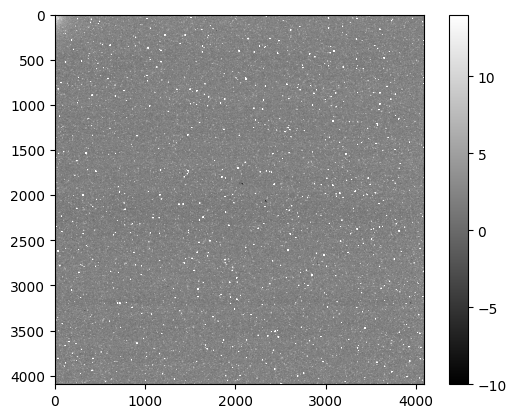

In [26]:
## see Dark combine
image_name_dark = 'combined_dark.fits' # Name of the FITS file

comb_dark = fits.open(path+'Dark_combined/'+image_name_dark) # Name of the dark  file

data_dark=comb_dark[0].data

plt.figure()
plt.imshow(data_dark, cmap='gray',vmin=-10, vmax=14)
plt.colorbar()

Text(0.5, 1.0, '4 Combined dark images with bias extracted')

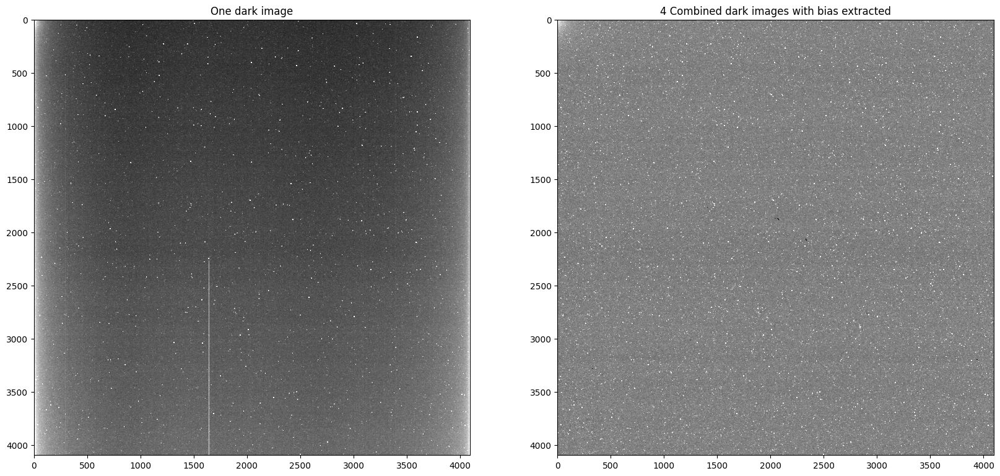

In [27]:
# Difference between one Dark and the combined non-vias Dark:
from astropy.nddata import CCDData

fig, ax_arr = plt.subplots(1, 2, figsize=(20, 10))

ax_arr[0].imshow(CCDData.read(path+'Dark/'+darks_1[0], unit='adu').data, cmap='gray',vmin=1037.75, vmax=1093.37)
ax_arr[0].set_title('One dark image')
ax_arr[1].imshow(comb_dark[0].data, cmap='gray',vmin=-10, vmax=14)
ax_arr[1].set_title('{} Combined dark images with bias extracted'.format(len(calibrated_darks)))

# Create master Flat

In [28]:
# See Flats

path_Flats = Path(path+'Flats/')
flats_raw = ImageFileCollection(path_Flats)

flats_raw.summary['file', 'imagetyp', 'exptime', 'filter']

file,imagetyp,exptime,filter
str50,str4,float64,str5
COG_514184_flats_Green_04_2022_10_22_16_32_55.fits,Flat,0.05,Green
COG_514185_flats_Green_03_2022_10_22_16_33_22.fits,Flat,2.0,Green
COG_514186_flats_Green_02_2022_10_22_16_33_47.fits,Flat,7.81,Green
COG_514187_flats_Green_01_2022_10_22_16_34_37.fits,Flat,9.48,Green
COG_514188_flats_Green_00_2022_10_22_16_35_28.fits,Flat,11.32,Green
COG_514189_flats_Red_04_2022_10_22_16_36_46.fits,Flat,0.05,Red
COG_514190_flats_Red_03_2022_10_22_16_37_28.fits,Flat,2.0,Red
COG_514191_flats_Red_02_2022_10_22_16_37_54.fits,Flat,20.0,Red
COG_514192_flats_Red_01_2022_10_22_16_38_56.fits,Flat,20.0,Red


In [29]:
# See filters available
flat_filters = set(h['filter'] for h in flats_raw.headers(imagetyp='Flat'))
flat_filters

{'Blue', 'Green', 'Red'}

**Before creating the master flats, we need to make sure that none of the images are saturated.**

To verify this, we can create a median and mean of the counts for each Flats image:

[1776.0, 8215.0, 26269.0, 26719.0, 26452.0, 1270.0, 3134.0, 19704.0, 15987.0, 13775.0, 15651.0, 65535.0, 10952.0, 65535.0, 6570.0]


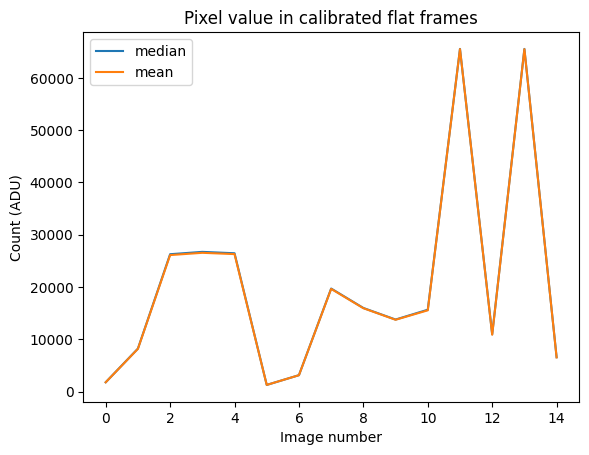

In [30]:
median_count = [np.median(data) for data in flats_raw.data(imagetyp='Flat')]
mean_count = [np.mean(data) for data in flats_raw.data(imagetyp='Flat')]
plt.plot(median_count, label='median')
plt.plot(mean_count, label='mean')
plt.xlabel('Image number')
plt.ylabel('Count (ADU)')
plt.title('Pixel value in calibrated flat frames')
plt.legend()
print(median_count)

This plots tell us that from the 14 images listed in the flats list, there are two that have counts > 60.000, meaning that they are saturated. We can observe a comparison of a non-saturated and a saturated Flat in the next figure:

Text(0.5, 1.0, 'Saturated Flat')

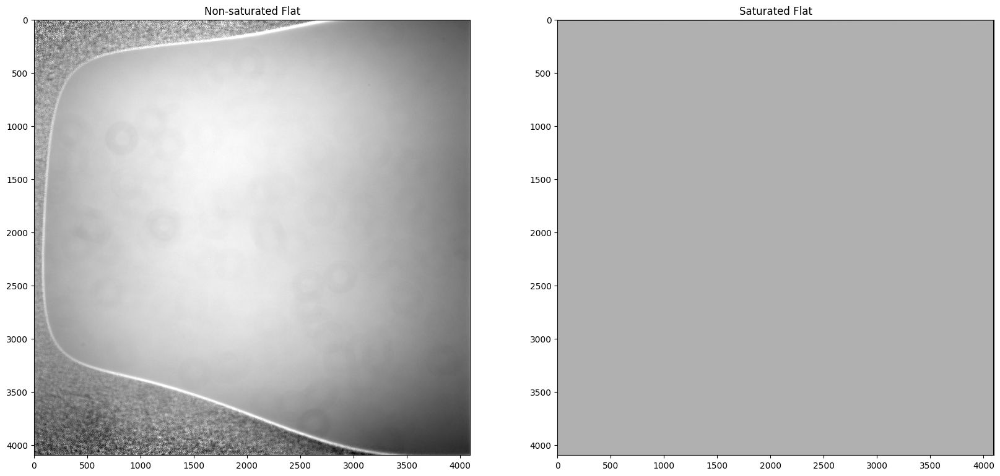

In [31]:
fig, ax_arr = plt.subplots(1, 2, figsize=(20, 10))

ax_arr[0].imshow(CCDData.read(path+'Flats/'+'COG_515151_flats_Blue_04_2022_10_25_16_11_08.fits', unit='adu').data, cmap='gray',vmin=12600, vmax=16800)
ax_arr[0].set_title('Non-saturated Flat')
ax_arr[1].imshow(CCDData.read(path+'Flats/'+'COG_515152_flats_Blue_03_2022_10_25_16_11_35.fits', unit='adu').data, cmap='gray',vmin=64500, vmax=66000)
ax_arr[1].set_title('Saturated Flat')

Before combining the Flats, we will erase the Flats that are not needed. In this case are images: COG_515152_flats_Blue_03_2022_10_25_16_11_35.fits	and COG_515154_flats_Blue_01_2022_10_25_16_15_29.fits.

After this, you can check with the plot before to see if everything is correct.

[1776.0, 8215.0, 26269.0, 26719.0, 26452.0, 1270.0, 3134.0, 19704.0, 15987.0, 13775.0, 15651.0, 65535.0, 10952.0, 65535.0, 6570.0]


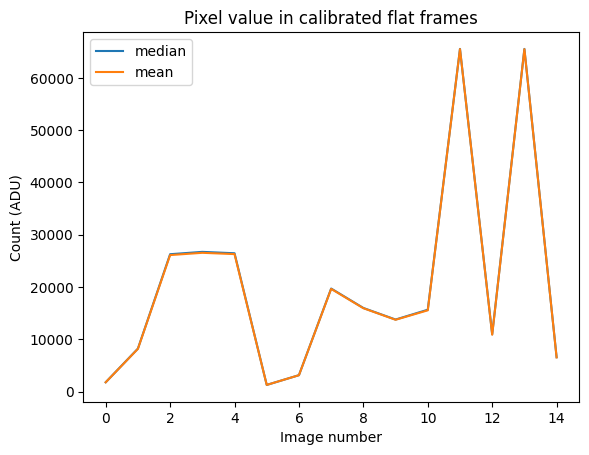

In [32]:
path_Flats = Path(path+'Flats/')
flats_raw = ImageFileCollection(path_Flats)

flats_raw.summary['file', 'imagetyp', 'exptime', 'filter']


median_count = [np.median(data) for data in flats_raw.data(imagetyp='Flat')]
mean_count = [np.mean(data) for data in flats_raw.data(imagetyp='Flat')]
plt.plot(median_count, label='median')
plt.plot(mean_count, label='mean')
plt.xlabel('Image number')
plt.ylabel('Count (ADU)')
plt.title('Pixel value in calibrated flat frames')
plt.legend()
print(median_count)

You could also eliminate some images that have very low counts. 

**Now to create the master flats images we first need to subtract the Bias and Dark in each Flat image.**

In [33]:
# Search for the combined bias 
from astropy import units as u

combined_bias = CCDData.read(path+'Bias/'+image_name_bias)
#actual_exposure_times = set(h['exptime'] for h in dark_reduced.headers(imagetyp='Dark', combined=True))
combined_Dark = CCDData.read(path+'Dark_combined/combined_dark.fits')

flats_1 = flats_raw.files_filtered(imagetyp='Flat')
combined_Flat=0

# subtract bias and darks from Flats and save them as Flats_X.fits
for j in range(0,len(flats_1)):
    combined_Flat = CCDData.read(path+'Flats/'+flats_1[j], unit='adu')
    ccd = ccdp.subtract_bias(combined_Flat, combined_bias)
    ccd = ccdp.subtract_dark(ccd, combined_Dark, exposure_time='exptime', exposure_unit=u.second, scale=True)
    name = 'Flats_{id}.fits'.format(id=j)
    Flat_calcomb = Path(path, 'Flat_combined')  
    Flat_calcomb.mkdir(exist_ok=True) 
    ccd.write(Flat_calcomb / name,overwrite=True)

In [34]:
path_Flats_1 = Path(path+'Flat_combined/')
flats_raw_1 = ImageFileCollection(path_Flats_1)

flats_raw_1.summary['file', 'imagetyp', 'exptime', 'filter']

file,imagetyp,exptime,filter
str13,str4,float64,str5
Flats_0.fits,Flat,0.05,Green
Flats_1.fits,Flat,2.0,Green
Flats_10.fits,Flat,0.05,Blue
Flats_11.fits,Flat,2.0,Blue
Flats_12.fits,Flat,0.2,Blue
Flats_13.fits,Flat,2.0,Blue
Flats_14.fits,Flat,0.2,Blue
Flats_2.fits,Flat,7.81,Green
Flats_3.fits,Flat,9.48,Green


**Now we need to combine de Flat in each filter**

In [35]:
def inv_median(a):
    return 1 / np.median(a)

In [36]:
for filt in flat_filters:
    to_combine = flats_raw_1.files_filtered(imagetyp='Flat', filter=filt, include_path=True)
    combined_flat = ccdp.combine(to_combine, method='average',scale=inv_median, unit='adu')

    combined_flat.meta['combined'] = True
    Flat_file_name = 'combined_flat_filter_{}.fits'.format(filt.replace("''", "p"))
    combined_flat.write(path_Flats_1 / Flat_file_name)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


Text(0.5, 1.0, 'Green Flat')

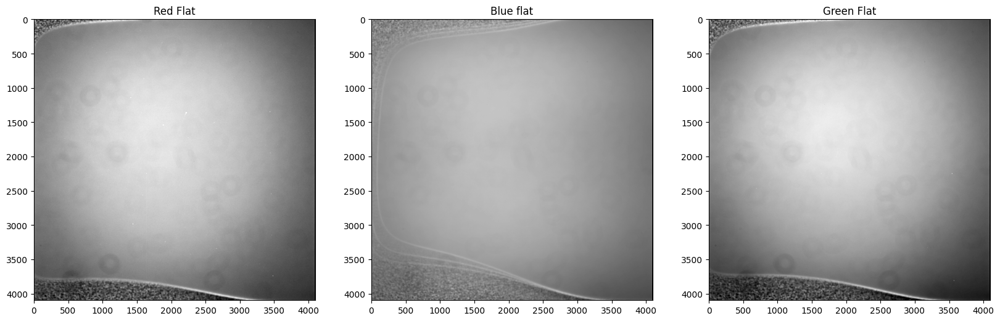

In [37]:
# Plot three Flats

Flat_blue = fits.open(path+'Flat_combined/combined_flat_filter_Blue.fits')
Flat_red = fits.open(path+'Flat_combined/combined_flat_filter_Red.fits')
Flat_green = fits.open(path+'Flat_combined/combined_flat_filter_Green.fits')

fig, ax_arr = plt.subplots(1, 3, figsize=(20, 10))

ax_arr[0].imshow(Flat_red[0].data, cmap='gray',vmin=0.82, vmax=1.11)
ax_arr[0].set_title('Red Flat')
ax_arr[1].imshow(Flat_blue[0].data, cmap='gray',vmin=0.82, vmax=1.11)
ax_arr[1].set_title('Blue flat'.format(len(calibrated_darks)))
ax_arr[2].imshow(Flat_green[0].data, cmap='gray',vmin=0.82, vmax=1.11)
ax_arr[2].set_title('Green Flat')

# Reduction to the science images

First we will move everything we need into a n:

In [38]:
path_img = Path(path, 'Object')  
img_raw = ImageFileCollection(path_img)
img_raw.summary['file', 'imagetyp', 'exptime', 'filter']

file,imagetyp,exptime,filter
str54,str6,float64,str5
COG_515173_M57_00_M 57_00__00_2022_10_25_17_30_47.fits,Object,60.0,Red
COG_515174_M57_00_M 57_00__01_2022_10_25_17_32_07.fits,Object,60.0,Red
COG_515175_M57_00_M 57_00__02_2022_10_25_17_33_26.fits,Object,60.0,Red
COG_515176_M57_00_M 57_00__00_2022_10_25_17_34_57.fits,Object,60.0,Green
COG_515177_M57_00_M 57_00__01_2022_10_25_17_36_17.fits,Object,60.0,Green
COG_515178_M57_00_M 57_00__02_2022_10_25_17_37_36.fits,Object,60.0,Green
COG_515179_M57_00_M 57_00__00_2022_10_25_17_39_11.fits,Object,60.0,Blue
COG_515180_M57_00_M 57_00__01_2022_10_25_17_40_31.fits,Object,60.0,Blue
COG_515181_M57_00_M 57_00__02_2022_10_25_17_41_51.fits,Object,60.0,Blue


In [39]:
# Search for the combined bias, Dark and Flats
science_imagetyp = 'Object'
flat_imagetyp = 'Flat'
exposure = 'exptime'

combined_bias = CCDData.read(path+'Bias/'+image_name_bias)
combined_Dark = CCDData.read(path+'Dark_combined/combined_dark.fits')
Science_raw = img_raw.files_filtered(imagetyp=science_imagetyp)



reduced_path = path+'Science_combined/'

Subtract bias from science images

In [40]:
# subtract the bias from the science images and save them as Science_X_b.fits

for j in range(0,len(Science_raw)):
    combined_science = CCDData.read(path+'Object/'+Science_raw[j], unit='adu')
    ccd = ccdp.subtract_bias(combined_science, combined_bias)
    name = 'Science_{id}_b.fits'.format(id=j)
    Science_calcomb = Path(path, 'Science_combined')  
    Science_calcomb.mkdir(exist_ok=True) 
    ccd.write(Science_calcomb / name,overwrite=True)

Lets see how the look next to each other:

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


Text(0.5, 1.0, 'One science image after Bias')

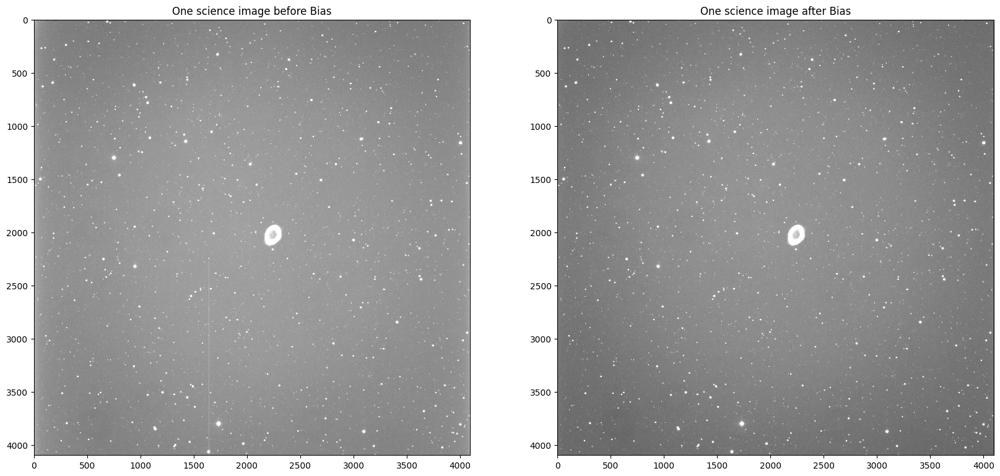

In [41]:
fig, ax_arr = plt.subplots(1, 2, figsize=(20, 10))

ax_arr[0].imshow(CCDData.read(path+'Object/'+'COG_515173_M57_00_M 57_00__00_2022_10_25_17_30_47.fits', unit='adu').data, cmap='gray',vmin=1100, vmax=1350)
ax_arr[0].set_title('One science image before Bias')
ax_arr[1].imshow(CCDData.read(path+'Science_combined/'+'Science_0_b.fits', unit='adu').data, cmap='gray',vmin=74, vmax=300)
ax_arr[1].set_title('One science image after Bias')

Subtract Dark from the previous science images

In [42]:
# subtract the Dark from the science images and save them as Science_X_bd.fits

img_b = ImageFileCollection(path+'Science_combined/')
Science_b = img_b.files_filtered(imagetyp=science_imagetyp)

for j in range(0,len(Science_b)):
    combined_science = CCDData.read(path+'Science_combined/'+Science_b[j], unit='adu')
    ccd = ccdp.subtract_dark(combined_science, combined_Dark, exposure_time='exptime', exposure_unit=u.second)
    name = 'Science_{id}_bd.fits'.format(id=j)
    Science_calcomb = Path(path, 'Science_combined')  
    Science_calcomb.mkdir(exist_ok=True) 
    ccd.write(Science_calcomb / name,overwrite=True)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


**Lets see how they look:**

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


Text(0.5, 1.0, 'One science image after Dark')

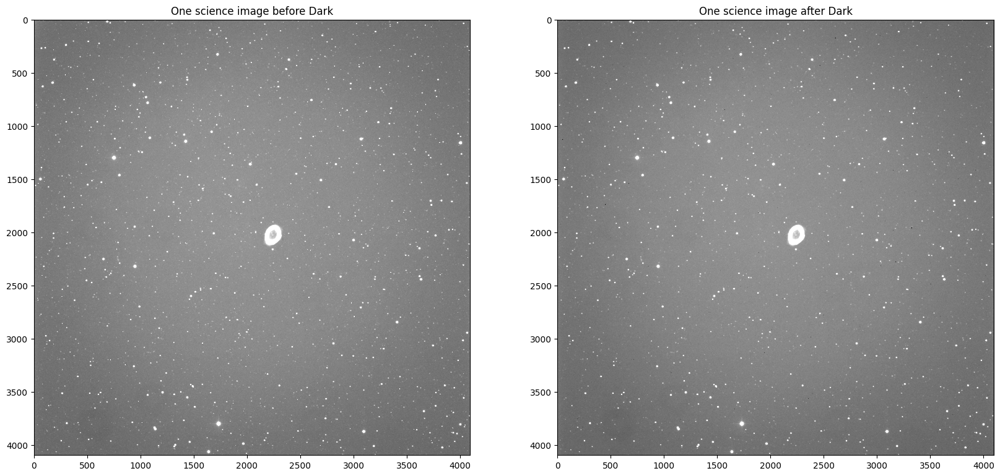

In [43]:
fig, ax_arr = plt.subplots(1, 2, figsize=(20, 10))

ax_arr[0].imshow(CCDData.read(path+'Science_combined/'+'Science_0_b.fits', unit='adu').data, cmap='gray',vmin=74, vmax=300)
ax_arr[0].set_title('One science image before Dark')
ax_arr[1].imshow(CCDData.read(path+'Science_combined/'+'Science_0_bd.fits', unit='adu').data, cmap='gray',vmin=74, vmax=300)
ax_arr[1].set_title('One science image after Dark')

**Lets divide by the Flats. We have to do this in each filter.**

In [44]:
path_flats=path+'Flat_combined/'
flats_reduced_t = ccdp.ImageFileCollection(path_flats)
combined_flats = {ccd.header['filter']: ccd for ccd in flats_reduced_t.ccds(imagetyp='Flat', combined=True)}

science_bd=ccdp.ImageFileCollection(path+'Science_combined/',glob_include='Science*_bd.fits')

science_bd.summary['file', 'imagetyp', 'exptime', 'filter'] #selected just the ones that are already bias and dark subtracted

file,imagetyp,exptime,filter
str18,str6,float64,str5
Science_0_bd.fits,Object,60.0,Red
Science_10_bd.fits,Object,60.0,Red
Science_1_bd.fits,Object,60.0,Red
Science_2_bd.fits,Object,60.0,Red
Science_3_bd.fits,Object,60.0,Red
Science_4_bd.fits,Object,60.0,Green
Science_5_bd.fits,Object,60.0,Green
Science_6_bd.fits,Object,60.0,Green
Science_7_bd.fits,Object,60.0,Blue


In [45]:
# Divide by the Flat and save them as Science_X_bdf.fits

all_reds = []
light_ccds = []
for light, file_name in science_bd.ccds(imagetyp=science_imagetyp, return_fname=True):
    light_ccds.append(light)
    
    #print(light.header['filter'])
    reduced=light
    good_flat = combined_flats[reduced.header['filter']]
    #print(combined_flats)
    reduced = ccdp.flat_correct(reduced, good_flat)
    all_reds.append(reduced)
    file=os.path.splitext(file_name)[0]
    name = '{id}f.fits'.format(id=file)
    Science_calcomb = Path(path, 'Science_combined')
    reduced.write(Science_calcomb / name, overwrite=True)

**Lets see how one image look**

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


Text(0.5, 1.0, 'One science Blue image after Flat')

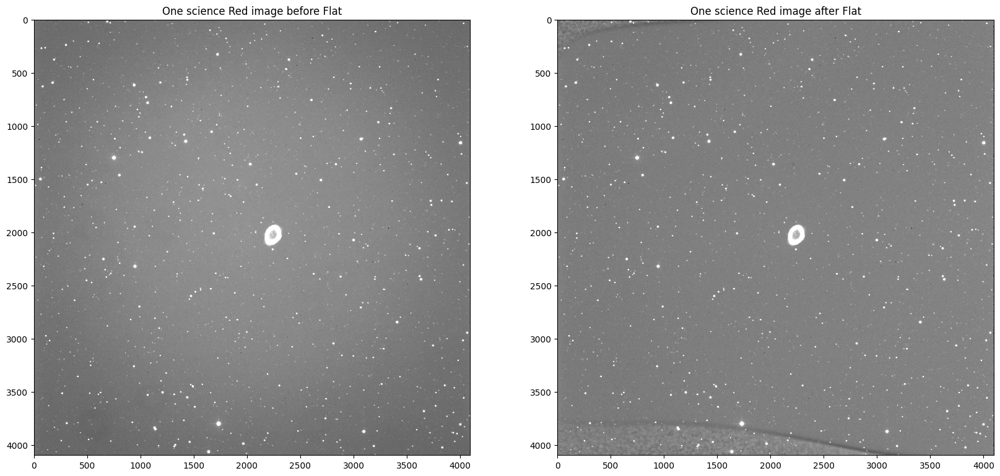

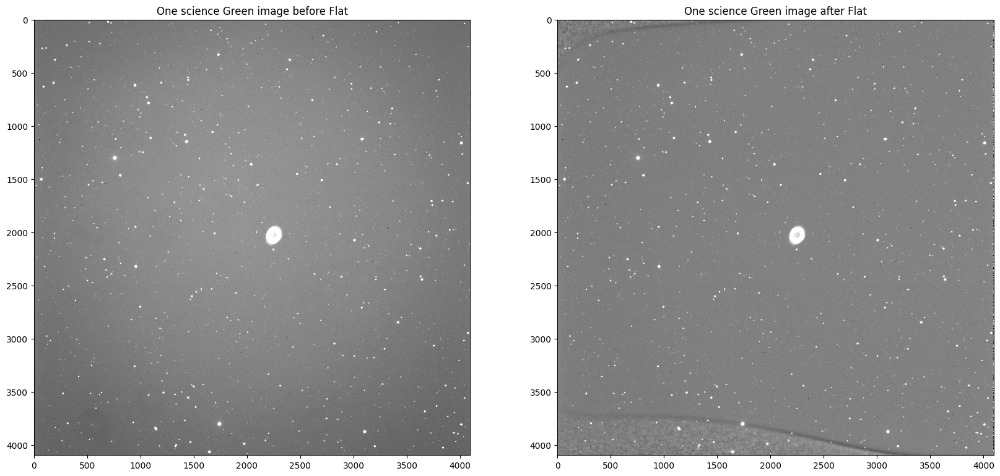

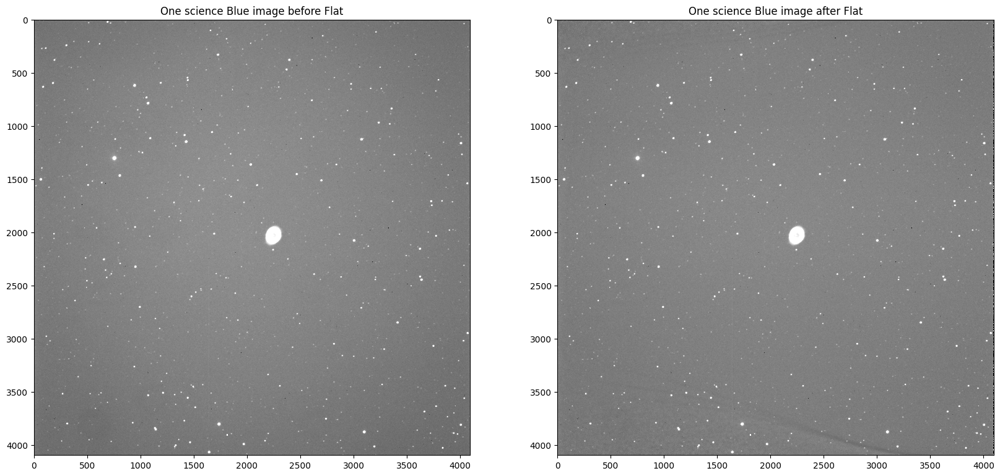

In [46]:
fig, ax_arr = plt.subplots(1, 2, figsize=(20, 10))

ax_arr[0].imshow(CCDData.read(path+'Science_combined/'+'Science_0_bd.fits', unit='adu').data, cmap='gray',vmin=74, vmax=300)
ax_arr[0].set_title('One science Red image before Flat')
ax_arr[1].imshow(CCDData.read(path+'Science_combined/'+'Science_0_bdf.fits', unit='adu').data, cmap='gray',vmin=74, vmax=300)
ax_arr[1].set_title('One science Red image after Flat')
fig, ax_arr = plt.subplots(1, 2, figsize=(20, 10))
ax_arr[0].imshow(CCDData.read(path+'Science_combined/'+'Science_6_bd.fits', unit='adu').data, cmap='gray',vmin=74, vmax=300)
ax_arr[0].set_title('One science Green image before Flat')
ax_arr[1].imshow(CCDData.read(path+'Science_combined/'+'Science_6_bdf.fits', unit='adu').data, cmap='gray',vmin=74, vmax=300)
ax_arr[1].set_title('One science Green image after Flat')
fig, ax_arr = plt.subplots(1, 2, figsize=(20, 10))
ax_arr[0].imshow(CCDData.read(path+'Science_combined/'+'Science_9_bd.fits', unit='adu').data, cmap='gray',vmin=12, vmax=186)
ax_arr[0].set_title('One science Blue image before Flat')
ax_arr[1].imshow(CCDData.read(path+'Science_combined/'+'Science_9_bdf.fits', unit='adu').data, cmap='gray',vmin=12, vmax=186)
ax_arr[1].set_title('One science Blue image after Flat')

# 

# Now we just need to combine each color of the science images

In [ ]:
# Things get quite memory heavy here, since everything was loaded before

# It might be useful to reload the notebook here, just to flushs the memory clean. After it has restarted, you can import
# these packages; the scripts below does not use any variables from above.

import numpy as np
from astropy.io import fits
from astropy.nddata import CCDData
import os
import warnings; warnings.simplefilter('ignore')
import matplotlib.pyplot as plt

from pathlib import Path
from ccdproc import ImageFileCollection
import ccdproc as ccdp

In [7]:
reduc_path = Path(path+'Science_combined/')

alldata = ImageFileCollection(reduc_path, glob_include='Science*_bdf.fits')
alldata.summary

file,simple,bitpix,naxis,naxis1,naxis2,extend,date-obs,end-obs,exposure,xbinning,ybinning,imagetyp,exptime,altitude,azimuth,dec,dec-ref,dec-tel,flipstat,ra,radecsys,ra-ref,ra-tel,istracki,airtemp,dometem,domehum,windspd,windpea,windavg,rain,cloubas,devitem,israin,iscloud,instrume,telescop,pxscal1,pxscal2,obscode,obslat,obslon,obsalt,filter,object,progid,progname,focuspos,epoch,observer,ownergid,ownergnm,ownerid,ownernm,alt-ref,az-ref,gpsstart,gpsend,progfrom,progto,sensorid,campid,projid,tslotid,agentid,targetid,targfrom,targto,catid,atomid,priority,frameid,abotver,ha,focusamt,focusmit,ccd-temp,set-temp,ccdfullh,ccdfullw,subtract_bias,subbias,bunit,subtract_dark,subdark,flat_correct,flatcor
str19,bool,int32,int32,int32,int32,bool,str27,str27,float64,int32,int32,str6,float64,float64,float64,float64,str12,float64,str4,float64,str4,str11,float64,str4,str5,str5,str5,str1,str1,str1,str1,str8,str5,str5,str5,str14,str16,str17,str17,str3,str11,str11,str3,str5,str4,str36,str3,int32,str4,str4,str36,str5,str36,str13,str1,str1,str27,str27,str24,str24,str36,str36,str36,str36,str36,str36,str24,str24,str8,str36,str1,str36,str3,float64,float64,float64,float64,float64,int32,int32,str7,str31,str3,str7,str71,str7,str29
Science_0_bdf.fits,True,-64,2,4096,4096,True,2022-10-25T17:30:47.6765809,2022-10-25T17:31:48.8477411,60.0,1,1,Object,60.0,65.8397222222222,240.228888888889,33.0608333333333,33:01:44.883,33.0608333333333,East,18.9069166666667,ICRS,18:53:35.97,18.9069166666667,True,12.85,13.26,75.91,0,0,0,0,2350.956,12.44,False,False,SBIG:X10120096,10Micron 4000HPS,0.441321015750558,0.441321015750558,COG,48.26128889,11.67117778,535,Red,M 57,2971c1bc-4733-41f0-a7a0-445f9a1193a0,M57,14316,REAL,Abot,00000000-0000-0000-0000-000000000000,empty,c2eb73a4-a0e6-4d38-907d-ea23e022aa78,Vadim Burwitz,0,0,2022-10-25T17:30:48.7079993,2022-10-25T17:31:48.6082885,2022-10-25T17:30:00.000Z,2022-10-25T17:45:00.000Z,f7415710-c1fb-404e-8f83-64d5a7337557,00000000-0000-0000-0000-000000000000,00000000-0000-0000-0000-000000000000,59c23b1d-6f67-42d3-b324-42881d7b092d,00000000-0000-0000-0000-000000000000,c178671c-c07e-42c5-ac93-8ea247046457,2022-10-25T17:30:00.000Z,2022-10-25T17:45:00.000Z,@2868878,15c6686e-d472-4aa7-b051-50140acd7650,0,78d7bb15-0ebc-4bd7-b47b-08fd71d07085,2.0,0.435532876267973,15.125,17.375,-15.03,-15.03,4096,4096,subbias,"ccd=<CCDData>, master=<CCDData>",adu,subdark,"ccd=<CCDData>, master=<CCDData>, exposure_time=exptime, exposure_unit=s",flatcor,"ccd=<CCDData>, flat=<CCDData>"
Science_10_bdf.fits,True,-64,2,4096,4096,True,2022-10-25T17:43:35.9302366,2022-10-25T17:44:37.1124276,60.0,1,1,Object,60.0,63.9444444444444,244.731666666667,33.0608333333333,33:01:44.883,33.0608333333333,East,18.9069166666667,ICRS,18:53:35.97,18.9069166666667,True,12.87,12.75,78.77,0,0,0,0,2265.146,12.42,False,True,SBIG:X10120096,10Micron 4000HPS,0.441321015750558,0.441321015750558,COG,48.26128889,11.67117778,535,Red,M 57,2971c1bc-4733-41f0-a7a0-445f9a1193a0,M57,14316,REAL,Abot,00000000-0000-0000-0000-000000000000,empty,c2eb73a4-a0e6-4d38-907d-ea23e022aa78,Vadim Burwitz,0,0,2022-10-25T17:43:36.9651559,2022-10-25T17:44:36.8687663,2022-10-25T17:30:00.000Z,2022-10-25T17:45:00.000Z,f7415710-c1fb-404e-8f83-64d5a7337557,00000000-0000-0000-0000-000000000000,00000000-0000-0000-0000-000000000000,59c23b1d-6f67-42d3-b324-42881d7b092d,00000000-0000-0000-0000-000000000000,c178671c-c07e-42c5-ac93-8ea247046457,2022-10-25T17:30:00.000Z,2022-10-25T17:45:00.000Z,@2868878,15c6686e-d472-4aa7-b051-50140acd7650,0,016f82b5-1d75-4b2a-989c-2627bab3e28a,2.0,0.49155617964347,14.5625,16.9375,-15.03,-15.03,4096,4096,subbias,"ccd=<CCDData>, master=<CCDData>",adu,subdark,"ccd=<CCDData>, master=<CCDData>, exposure_time=exptime, exposure_unit=s",flatcor,"ccd=<CCDData>, flat=<CCDData>"
Science_1_bdf.fits,True,-64,2,4096,4096,True,2022-10-25T17:44:55.6210193,2022-10-25T17:45:56.8631446,60.0,1,1,Object,60.0,63.7447222222222,245.168333333333,33.0608333333333,33:01:44.883,33.0608333333333,East,18.9069166666667,ICRS,18:53

In [8]:
data_red = alldata.files_filtered(filter='Red',include_path=True)
data_blue = alldata.files_filtered(filter='Blue',include_path=True)
data_green = alldata.files_filtered(filter='Green',include_path=True)

In [9]:
data_green

['Data\\Data\\Science_combined\\Science_4_bdf.fits',
 'Data\\Data\\Science_combined\\Science_5_bdf.fits',
 'Data\\Data\\Science_combined\\Science_6_bdf.fits']

In [12]:
#combining red images
combined_red = ccdp.combine(data_red, method='median', unit='adu')
combined_red.meta['combined'] = True
combined_red.write(reduc_path / 'combined_M57_Red.fits',overwrite=True)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


In [13]:
#combining green images
combined_green = ccdp.combine(data_green, method='median', unit='adu')
combined_green.meta['combined'] = True
combined_green.write(reduc_path / 'combined_M57_Green.fits',overwrite=True)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


In [14]:
#combining blue images
combined_blue = ccdp.combine(data_blue, method='median', unit='adu')
combined_blue.meta['combined'] = True
combined_blue.write(reduc_path / 'combined_M57_Blue.fits',overwrite=True)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


# See the final images

Text(0.5, 1.0, 'Green image')

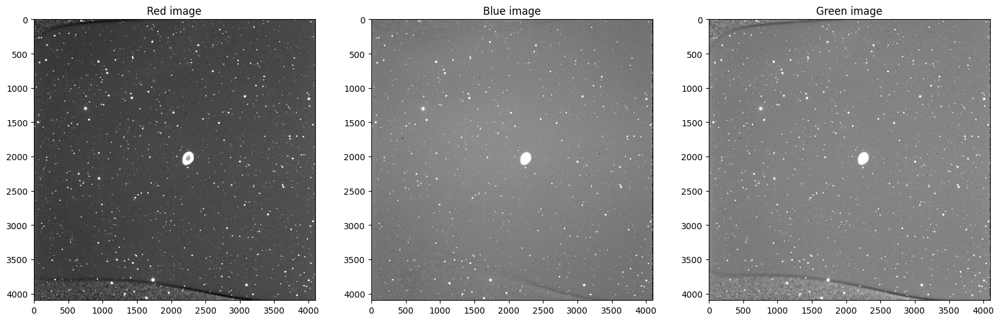

In [18]:
# Plot three Flats

blue = fits.open(path+'Science_combined/combined_M57_Blue.fits')
red = fits.open(path+'Science_combined/combined_M57_Red.fits')
green = fits.open(path+'Science_combined/combined_M57_Green.fits')

fig, ax_arr = plt.subplots(1, 3, figsize=(20, 10))

ax_arr[0].imshow(red[0].data, cmap='gray',vmin=170, vmax=292)
ax_arr[0].set_title('Red image')
ax_arr[1].imshow(blue[0].data, cmap='gray',vmin=46, vmax=152)
ax_arr[1].set_title('Blue image') #.format(len(calibrated_darks)))
ax_arr[2].imshow(green[0].data, cmap='gray',vmin=123, vmax=238)
ax_arr[2].set_title('Green image')

Note: don't worry about those black lines seen in the image, it is a problem of the telescope.

_____________________________

**Important information**

This pipeline is a basic reduction, and it shows you the steps to follow for the reduction of images. The final image could be improved by including different parameters in each step, viewing the images before, and selecting the right ones.

You can modify this pipeline as you like if you want to improve the reduction. You can see in Python what extra parameters can be added to each class.